In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from catboost import CatBoostRegressor

# Load the data
dft = pd.read_csv('data/train.csv').iloc[:,1:].copy()
df = dft.iloc[:,1:].copy()

# Preprocess the data
df['BsmtFinSF'] = df['BsmtFinSF1'] + df['BsmtFinSF2']
df['BsmtFinType'] = df['BsmtFinType1'].astype(bool) | df['BsmtFinType2'].astype(bool)
df = df.drop(columns=['BsmtFinSF1', 'BsmtFinSF2', 'BsmtFinType1', 'BsmtFinType2'])

# Split the data into features and target
X = df.drop('SalePrice', axis=1)
y = df['SalePrice']

In [2]:


# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=49)

# Define the column transformers for numerical and categorical columns
numerical_transformer = StandardScaler(with_mean=False)
categorical_transformer = OneHotEncoder(handle_unknown='ignore')


# Identify numerical and categorical columns
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = X.select_dtypes(include=['object']).columns

# Create the preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ],
    remainder='passthrough'
)

# Create the final pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', CatBoostRegressor())
])

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Make predictions on the test set
y_pred = pipeline.predict(X_test)

Learning rate set to 0.04196
0:	learn: 77806.8320115	total: 169ms	remaining: 2m 48s
1:	learn: 75837.8865005	total: 182ms	remaining: 1m 30s
2:	learn: 73915.6269284	total: 186ms	remaining: 1m 1s
3:	learn: 72069.8869058	total: 190ms	remaining: 47.3s
4:	learn: 70287.4669582	total: 193ms	remaining: 38.4s
5:	learn: 68652.1910984	total: 196ms	remaining: 32.5s
6:	learn: 67139.8252075	total: 199ms	remaining: 28.2s
7:	learn: 65518.8363952	total: 202ms	remaining: 25s
8:	learn: 64108.7005201	total: 204ms	remaining: 22.5s
9:	learn: 62690.8774641	total: 207ms	remaining: 20.5s
10:	learn: 61333.5851249	total: 210ms	remaining: 18.9s
11:	learn: 60005.8019054	total: 228ms	remaining: 18.7s
12:	learn: 58622.6749725	total: 233ms	remaining: 17.7s
13:	learn: 57477.9761918	total: 236ms	remaining: 16.6s
14:	learn: 56421.9821667	total: 241ms	remaining: 15.8s
15:	learn: 55284.0827156	total: 243ms	remaining: 14.9s
16:	learn: 54272.5588306	total: 246ms	remaining: 14.2s
17:	learn: 53161.5073240	total: 249ms	remainin

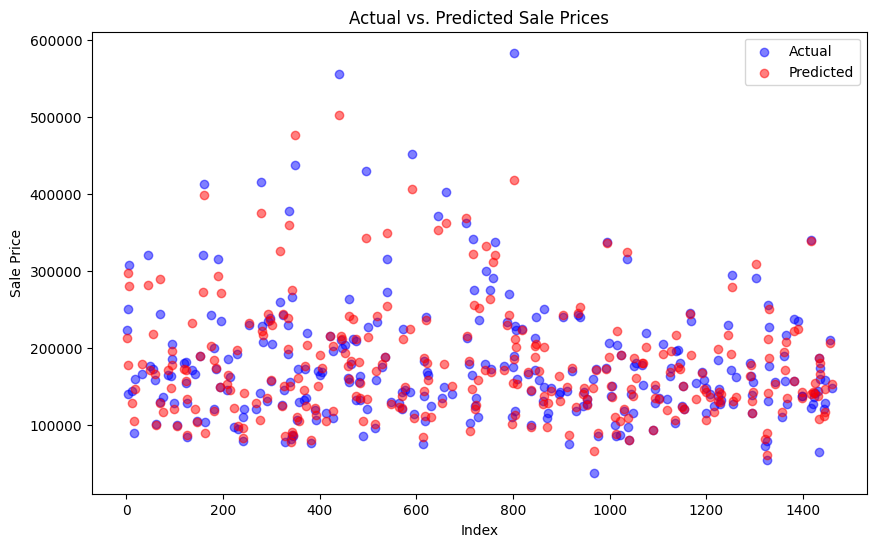

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
# Create a DataFrame for plotting
plot_df = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_pred
})

# Plot the actual and predicted values
plt.figure(figsize=(10, 6))
plt.scatter(plot_df.index, plot_df['Actual'], label='Actual', color='b', alpha=0.5)
plt.scatter(plot_df.index, plot_df['Predicted'], label='Predicted', color='r', alpha=0.5)
plt.xlabel('Index')
plt.ylabel('Sale Price')
plt.title('Actual vs. Predicted Sale Prices')
plt.legend()
plt.show()

In [4]:

from sklearn.model_selection import GridSearchCV

# Define the parameter grid for CatBoostRegressor
param_grid = {
    'model__depth': [4, 6, 8],
    'model__learning_rate': [0.01, 0.05, 0.1],
    'model__l2_leaf_reg': [1, 3, 5]
}

# Scale the target variable
y_scaler = StandardScaler()
y_train_scaled = y_scaler.fit_transform(y_train.values.reshape(-1, 1))
y_test_scaled = y_scaler.transform(y_test.values.reshape(-1, 1))

# Perform grid search
grid_search = GridSearchCV(pipeline, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train_scaled.ravel())

# Print the best parameters and the best score
print("Best parameters: ", grid_search.best_params_)
print("Best score: ", -grid_search.best_score_)

# Make predictions on the test set using the best model
y_pred_scaled = grid_search.best_estimator_.predict(X_test)

# Inverse transform the scaled predictions and actual values
y_pred = y_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1))
y_test = y_scaler.inverse_transform(y_test_scaled)

0:	learn: 1.0142357	total: 1.26ms	remaining: 1.26s
1:	learn: 1.0077919	total: 2.42ms	remaining: 1.21s
2:	learn: 1.0011800	total: 3.66ms	remaining: 1.22s
3:	learn: 0.9955098	total: 4.87ms	remaining: 1.21s
4:	learn: 0.9896225	total: 6.05ms	remaining: 1.2s
5:	learn: 0.9840755	total: 7.31ms	remaining: 1.21s
6:	learn: 0.9785007	total: 8.49ms	remaining: 1.2s
7:	learn: 0.9731584	total: 9.66ms	remaining: 1.2s
8:	learn: 0.9678486	total: 10.8ms	remaining: 1.19s
9:	learn: 0.9619998	total: 12.3ms	remaining: 1.22s
10:	learn: 0.9555458	total: 13.6ms	remaining: 1.22s
11:	learn: 0.9499548	total: 14.7ms	remaining: 1.21s
12:	learn: 0.9446619	total: 15.8ms	remaining: 1.2s
13:	learn: 0.9394327	total: 16.9ms	remaining: 1.19s
14:	learn: 0.9341975	total: 17.9ms	remaining: 1.18s
15:	learn: 0.9289774	total: 19ms	remaining: 1.17s
16:	learn: 0.9231159	total: 20.4ms	remaining: 1.18s
17:	learn: 0.9179042	total: 21.5ms	remaining: 1.17s
18:	learn: 0.9131703	total: 22.7ms	remaining: 1.17s
19:	learn: 0.9084935	total: 

In [10]:
# Print the best parameters and the best score
print("Best parameters: ", grid_search.best_params_)
print("Best score: ", -grid_search.best_score_)

# Make predictions on the test set using the best model
y_pred_scaled = grid_search.best_estimator_.predict(X_test)

# Inverse transform the scaled predictions and actual values
y_pred = y_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1))
y_test = y_scaler.inverse_transform(y_test_scaled)

Best parameters:  {'model__depth': 4, 'model__l2_leaf_reg': 1, 'model__learning_rate': 0.05}
Best score:  0.11256982792910428


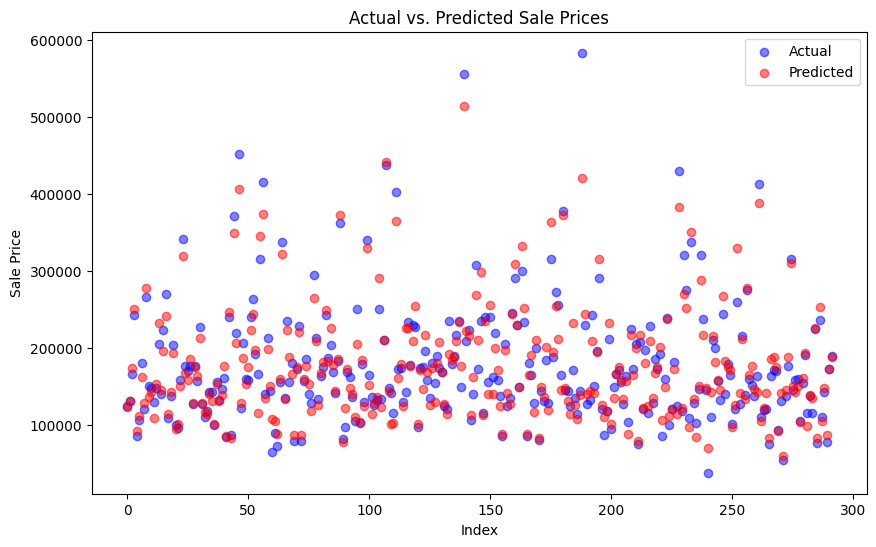

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
# Make predictions on the test set using the best model


# Create a DataFrame for plotting
plot_df = pd.DataFrame({
    'Actual': y_test.flatten(),
    'Predicted': y_pred.flatten()
})
# Plot the actual and predicted values
plt.figure(figsize=(10, 6))
plt.scatter(plot_df.index, plot_df['Actual'], label='Actual', color='b', alpha=0.5)
plt.scatter(plot_df.index, plot_df['Predicted'], label='Predicted', color='r', alpha=0.5)
plt.xlabel('Index')
plt.ylabel('Sale Price')
plt.title('Actual vs. Predicted Sale Prices')
plt.legend()
plt.show()


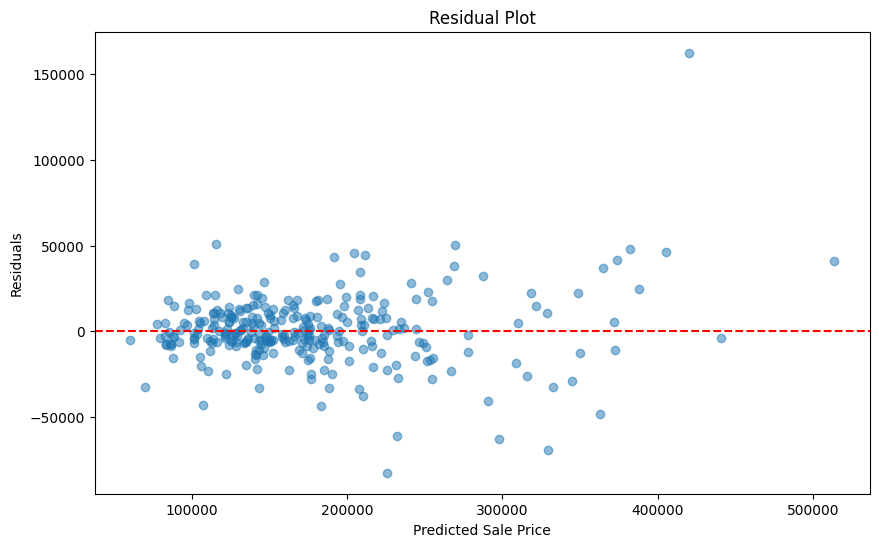

In [13]:
# Calculate residuals
residuals = y_test - y_pred

# Plot residuals
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals, alpha=0.5)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Sale Price')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

0:	learn: 73140.8100421	total: 855us	remaining: 854ms
1:	learn: 71011.5964950	total: 1.72ms	remaining: 859ms
2:	learn: 68916.2758097	total: 2.62ms	remaining: 872ms
3:	learn: 67072.6969964	total: 3.47ms	remaining: 864ms
4:	learn: 64873.3298135	total: 4.31ms	remaining: 858ms
5:	learn: 63084.4647333	total: 5.19ms	remaining: 859ms
6:	learn: 61436.7841801	total: 6.02ms	remaining: 854ms
7:	learn: 59922.7426061	total: 6.81ms	remaining: 845ms
8:	learn: 58313.9157506	total: 7.64ms	remaining: 841ms
9:	learn: 56611.2563189	total: 8.53ms	remaining: 844ms
10:	learn: 54755.4477930	total: 9.42ms	remaining: 847ms
11:	learn: 53191.1501828	total: 10.4ms	remaining: 853ms
12:	learn: 51807.0754711	total: 11.4ms	remaining: 868ms
13:	learn: 50519.2329715	total: 12.5ms	remaining: 878ms
14:	learn: 49084.3960557	total: 13.3ms	remaining: 873ms
15:	learn: 47648.1473182	total: 14.1ms	remaining: 867ms
16:	learn: 46588.7452081	total: 15ms	remaining: 866ms
17:	learn: 45354.0161835	total: 15.8ms	remaining: 863ms
18:	l

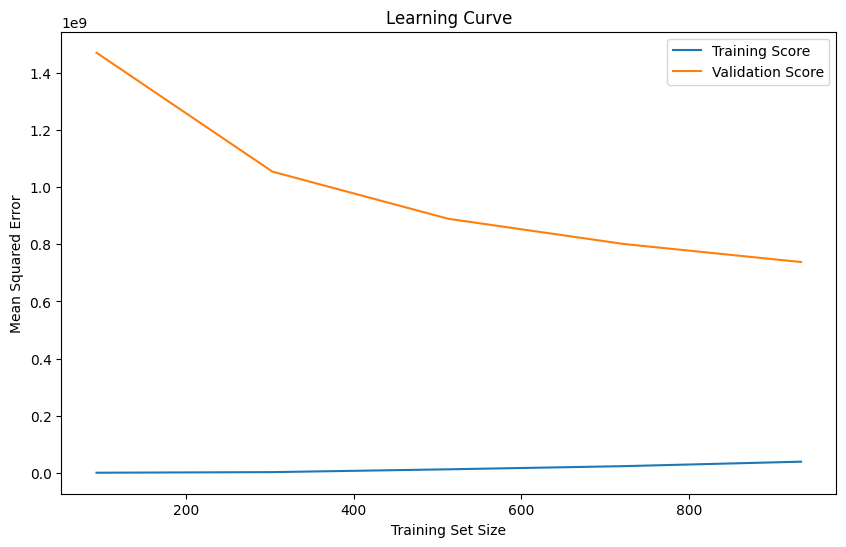

In [21]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, valid_scores = learning_curve(
    grid_search.best_estimator_, X_train, y_train, cv=5, scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis=1)
valid_scores_mean = -valid_scores.mean(axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label='Training Score')
plt.plot(train_sizes, valid_scores_mean, label='Validation Score')
plt.xlabel('Training Set Size')
plt.ylabel('Mean Squared Error')
plt.title('Learning Curve')
plt.legend()
plt.show()

In [35]:
# Load the data
dftest = pd.read_csv('data/test.csv').iloc[:,1:].copy()

# Preprocess the data
dftest['BsmtFinSF'] = dftest['BsmtFinSF1'] + dftest['BsmtFinSF2']
dftest['BsmtFinType'] = dftest['BsmtFinType1'].astype(bool) | dftest['BsmtFinType2'].astype(bool)
dftest = dftest.drop(columns=['BsmtFinSF1', 'BsmtFinSF2', 'BsmtFinType1', 'BsmtFinType2'])

final_pred = grid_search.best_estimator_.predict(dftest)
# Load the data
dft= pd.read_csv('data/test.csv')
pd.Series(index=dft['Id'],data=final_pred).rename('SalePrice').to_csv('submission.csv')

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2915,160,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal
1455,2916,160,RM,21.0,1894,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml
1456,2917,20,RL,160.0,20000,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,9,2006,WD,Abnorml
1457,2918,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,MnPrv,Shed,700,7,2006,WD,Normal
